In [6]:
from nuscenes.nuscenes import NuScenes
from pathlib import Path
from utils import read_image, show_image, read_lidar, show_lidar_pointcloud
from pyquaternion import Quaternion

In [7]:
nuscenes_root_dir = Path('./v1.0-mini')

## Get samples for one of the scenes

In [8]:
nusc = NuScenes(version='v1.0-mini', dataroot=nuscenes_root_dir)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.605 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


In [9]:
nusc.list_scenes()

scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

In [10]:
my_scene = nusc.scene[0]
my_scene

{'token': 'cc8c0bf57f984915a77078b10eb33198',
 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
 'nbr_samples': 39,
 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0',
 'name': 'scene-0061',
 'description': 'Parked truck, construction, intersection, turn left, following a van'}

In [11]:
my_scene_samples_tokens = [sample['token'] for sample in nusc.sample if sample['scene_token'] == my_scene['token']]

In [12]:
my_scene_samples_tokens

['ca9a282c9e77460f8360f564131a8af5',
 '39586f9d59004284a7114a68825e8eec',
 '356d81f38dd9473ba590f39e266f54e5',
 'e0845f5322254dafadbbed75aaa07969',
 'c923fe08b2ff4e27975d2bf30934383b',
 'f1e3d9d08f044c439ce86a2d6fcca57b',
 '4f545737bf3347fbbc9af60b0be9a963',
 '7626dde27d604ac28a0240bdd54eba7a',
 'be99ffc878b24aca8956bbb4e0f97d0c',
 '9813c23a5f1448b09bb7910fea9baf20',
 '023c4df2d451409881d8e6ea82f14704',
 'c235638ed66145988d17f9d0601923f2',
 'bc3c8a953f6b4dcdb77b521d89f3d9d5',
 '1e3d79dae62742a0ad64c91679863358',
 '2afb9d32310e4546a71cbe432911eca2',
 'cd21dbfc3bd749c7b10a5c42562e0c42',
 '88449a5cb1644a199c1c11f6ac034867',
 '2ff86dc19c4644a1a88ce5ba848f56e5',
 'bf2938e43c6f487497cda76b51bfc406',
 'b26e791522294bec90f86fd72226e35c',
 'c844bf5a9f2243ff8f4bf2c85fe218ff',
 'fedfb3a6cb804635a0f47143f9ca8d6f',
 '965f6af5a92449348409029a5f048a38',
 '4711bcd34644420da8bc77163431888e',
 'a34fabc7aa674713b71f98ec541eb2d4',
 'c78067571d104caba7c568a847d56971',
 '4246e57f018745c9b2bc68feb3d71b58',
 

## Let's look at the data for one sample in the scene

In [13]:
sample_token = my_scene_samples_tokens[3]  #'e0845f5322254dafadbbed75aaa07969'

sample_info = nusc.get('sample', sample_token)

In [14]:
sample_info

{'token': 'e0845f5322254dafadbbed75aaa07969',
 'timestamp': 1532402929197353,
 'prev': '356d81f38dd9473ba590f39e266f54e5',
 'next': 'c923fe08b2ff4e27975d2bf30934383b',
 'scene_token': 'cc8c0bf57f984915a77078b10eb33198',
 'data': {'RADAR_FRONT': '54035fc2905d46398457245cf0a9f157',
  'RADAR_FRONT_LEFT': 'cd4b52d0fa774767b3bbc2d92820e5f3',
  'RADAR_FRONT_RIGHT': '3362983931c04dc28ca98d431ac9b435',
  'RADAR_BACK_LEFT': 'a1e014ec083446f7aca5d68478c2970a',
  'RADAR_BACK_RIGHT': '516d3960a2b041a6bf06f1fc0b23c7a7',
  'LIDAR_TOP': 'c4f1a270736445e185379a80c29a5139',
  'CAM_FRONT': '74e7a9260c5d45b78b831528b62daf41',
  'CAM_FRONT_RIGHT': 'e2dc487869f546c39ee01ebba7ec434e',
  'CAM_BACK_RIGHT': '88745727b75b429ba27fad28533e7323',
  'CAM_BACK': '32eab9aacf1a4cdca7d6c2c58c664b0f',
  'CAM_BACK_LEFT': 'e5c06f809d9b4149801701aefd99eac5',
  'CAM_FRONT_LEFT': '25cd4f36b0884bcabf15ed17a318b17a'},
 'anns': ['74f550e3257c4f52af1102c0d49d37b8',
  '80d5ba393dff41a49235f58fab2d383f',
  '03fbb8c1d6394a7fa3c8da2

### CAM_FRONT data for the sample

In [15]:
camera_front_data = nusc.get('sample_data', sample_info['data']['CAM_FRONT'])

In [16]:
camera_front_data

{'token': '74e7a9260c5d45b78b831528b62daf41',
 'sample_token': 'e0845f5322254dafadbbed75aaa07969',
 'ego_pose_token': '74e7a9260c5d45b78b831528b62daf41',
 'calibrated_sensor_token': '1d31c729b073425e8e0202c5c6e66ee1',
 'timestamp': 1532402929162460,
 'fileformat': 'jpg',
 'is_key_frame': True,
 'height': 900,
 'width': 1600,
 'filename': 'samples/CAM_FRONT/n015-2018-07-24-11-22-45+0800__CAM_FRONT__1532402929162460.jpg',
 'prev': '31280aeef5f04d3cb00724081dcca0e4',
 'next': 'fa7b4f444c9c45f8b740ada917003788',
 'sensor_modality': 'camera',
 'channel': 'CAM_FRONT'}

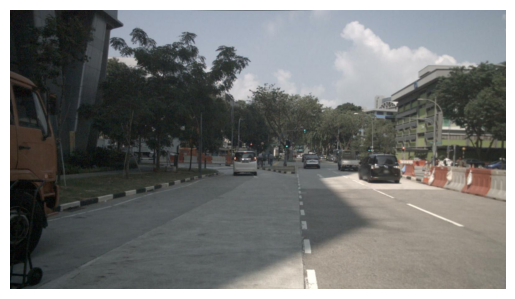

In [17]:
camera_front_image = read_image(nuscenes_root_dir / camera_front_data['filename'])
show_image(camera_front_image)

In [18]:
camera_calibration = nusc.get('calibrated_sensor', camera_front_data['calibrated_sensor_token'])
camera_calibration

{'token': '1d31c729b073425e8e0202c5c6e66ee1',
 'sensor_token': '725903f5b62f56118f4094b46a4470d8',
 'translation': [1.70079118954, 0.0159456324149, 1.51095763913],
 'rotation': [0.4998015430569128,
  -0.5030316162024876,
  0.4997798114386805,
  -0.49737083824542755],
 'camera_intrinsic': [[1266.417203046554, 0.0, 816.2670197447984],
  [0.0, 1266.417203046554, 491.50706579294757],
  [0.0, 0.0, 1.0]]}

### LIDAR_TOP data for the sample

In [19]:
lidar_top_data = nusc.get('sample_data', sample_info['data']['LIDAR_TOP'])
lidar_top_data

{'token': 'c4f1a270736445e185379a80c29a5139',
 'sample_token': 'e0845f5322254dafadbbed75aaa07969',
 'ego_pose_token': 'c4f1a270736445e185379a80c29a5139',
 'calibrated_sensor_token': 'a183049901c24361a6b0b11b8013137c',
 'timestamp': 1532402929197353,
 'fileformat': 'pcd',
 'is_key_frame': True,
 'height': 0,
 'width': 0,
 'filename': 'samples/LIDAR_TOP/n015-2018-07-24-11-22-45+0800__LIDAR_TOP__1532402929197353.pcd.bin',
 'prev': '28c69a4bc2fc45e0a15b4eb483edb8e6',
 'next': '958e7afa953641cb92a3541c8de12ee0',
 'sensor_modality': 'lidar',
 'channel': 'LIDAR_TOP'}

In [20]:
lidar_top_pointcloud = read_lidar(nuscenes_root_dir / lidar_top_data['filename'])
show_lidar_pointcloud(lidar_top_pointcloud)

In [21]:
lidar_calibration = nusc.get('calibrated_sensor', lidar_top_data['calibrated_sensor_token'])
lidar_calibration

{'token': 'a183049901c24361a6b0b11b8013137c',
 'sensor_token': 'dc8b396651c05aedbb9cdaae573bb567',
 'translation': [0.943713, 0.0, 1.84023],
 'rotation': [0.7077955119163518,
  -0.006492242056004365,
  0.010646214713995808,
  -0.7063073142877817],
 'camera_intrinsic': []}

### Transform quaternion to rotation matrix

In [22]:
q = Quaternion(lidar_calibration['rotation'])

In [23]:
q.rotation_matrix

array([[ 0.00203327,  0.99970406,  0.02424172],
       [-0.99998053,  0.00217566, -0.00584864],
       [-0.00589965, -0.02422936,  0.99968902]])